## Import

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os,sys, kimimaro
import numpy as np
from skimage.morphology import disk, ball, square
import scipy.ndimage as nd
import scipy.signal as sig
import matplotlib.pyplot as plt
import matplotlib.animation as anim
import cloudvolume as cv
from IPython.display import HTML
from matplotlib.collections import LineCollection

sys.path.append("/home/ehefti/Github/axon_tracking/")
import axon_tracking.skeletonization as skel
import axon_tracking.template_extraction as te
import axon_tracking.visualization as vis
import axon_tracking.utils as ut

## Templates Overview

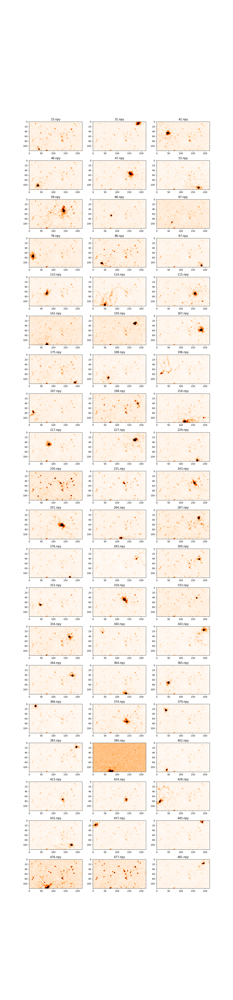

In [3]:
root_path = '/net/bs-filesvr02/export/group/hierlemann/intermediate_data/Maxtwo/phornauer/Torsten_2/241021/T002523/AxonTracking'
stream_id = 'well003'
suffix = "sorter_output" 
overview_path = os.path.join(root_path, stream_id, suffix) 
vis.plot_template_overview(overview_path, n_cols = 3, vmin=-10, vmax=0, filename='overview', unit_ids= None, overwrite=False)

## Preprocessing Template

In [4]:
params = dict()
params['noise_threshold'] = -0.5 # Noise threshold as factor of the noise level (None to skip)
params['abs_threshold'] = -0.15 # Absolut threshold in [uV]/sample
params['upsample'] = [0.5,0.5,0.25] # Spacing for interpolation in [x,y,z] direction
params['sampling_rate'] = 10000/params['upsample'][2] # [Hz]
params['ms_cutout'] = [3.0, 5.0] # Cutout in ms before and after the spike
#params['filter_footprint'] = ball(1)
params['max_velocity'] = 0.8 # [m/s]
params['max_noise_level'] = 0.25 # Mean of the noise level/matrix
params['el_spacing'] = 17.5 * params['upsample'][0] # Electrode spacing in um
params['ais_detection'] = "amp" # "time" or "dev" or "amp" or None
params['buffer_frames'] = 10 # Buffer frames for the ais cutout - time before the highest peak (otherwise we have a huge gap)

### Remove neurons that appear on many templates

In [5]:
from skimage.feature import peak_local_max
from scipy.ndimage import binary_dilation, generate_binary_structure


def identify_ubiquitous_peaks(templates, min_distance=5, threshold_abs=None, threshold_rel=0.1):
    """
    Calculates the median and finds peaks using skimage.feature.peak_local_max.

    Args:
        templates: List of 3D numpy arrays.
        min_distance: Minimum distance between peaks (in voxels).
        threshold_abs: Absolute intensity threshold.
        threshold_rel: Relative intensity threshold (fraction of max value).

    Returns:
        median_template, peak_coordinates (as a NumPy array)
    """
    stacked_templates = np.stack(templates, axis=0)
    median_template = np.median(stacked_templates, axis=0)
    # print(median_template.shape[:2])

    peak_coordinates = peak_local_max(
        median_template,
        min_distance=min_distance,
        threshold_abs=threshold_abs,
        threshold_rel=threshold_rel,
        exclude_border=False
    )
    # print(peak_coordinates)

    return median_template, peak_coordinates



def calculate_peak_mask(sorter_path, input_folder, min_distance=5, threshold_abs=None, threshold_rel=0.1, dilation_iterations=3):
    """
    This function creates a median template, detects peaks, removes these peaks from each template, and saves them to a new folder.

    Args:
        input_folder: Path to the original templates (.npy files).
        output_folder: Path for the processed templates.
        min_distance: Minimum distance between peaks.
        threshold_abs: Absolute intensity threshold for peak detection.
        threshold_rel: Relative intensity threshold for peak detection (fraction of max).
        dilation_iterations: Number of iterations for dilating the peak mask.
    """

    # Create paths
    input_path = os.path.join(sorter_path, input_folder)
    
    # Load Templates
    template_files = [f for f in os.listdir(input_path) if f.endswith('.npy')]
    templates = []
    for file in template_files:
        filepath = os.path.join(input_path, file)
        template = np.load(filepath)  # Load using np.load for .npy files
        templates.append(template)

    # Average and Find Peaks (using the skimage function)
    median_template, peak_coordinates = identify_ubiquitous_peaks(templates, 
                                                                  min_distance = min_distance, 
                                                                  threshold_abs = threshold_abs, 
                                                                  threshold_rel = threshold_rel)

    # Create a Mask for Peak Removal
    peak_mask = np.zeros(median_template.shape[:2], dtype=bool)
    for x, y, z in peak_coordinates:
        peak_mask[x, y] = True

    # Dilate the mask, so we also remove the region around the peak, not only the peak itself
    struct = generate_binary_structure(2, 1)
    dilated_peak_mask = binary_dilation(peak_mask, structure=struct, iterations=dilation_iterations)
    
    return dilated_peak_mask, templates, template_files


def peak_mask_processing(sorter_path, output_folder, dilated_peak_mask, templates, template_files, ais_rad=10):
    """
    Processes templates, removing peaks identified by a 2D dilated mask,
    preserving a 2D region around the axon initial segment (AIS).

    Args:
        sorter_path: Base path.
        output_folder: Output folder name.
        dilated_peak_mask: The boolean mask of regions to remove.
        templates: List of numpy arrays.
        template_files: List of filenames.
        ais_rad: Radius around the AIS to protect (2D).
    """
    output_path = os.path.join(sorter_path, output_folder)
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    processed_templates = []
    for i, template in enumerate(templates):
        processed_template = template.copy()

        # Find AIS location (maximum value in the template)
        ais_flattened_index = np.argmax(template)
        ais_x, ais_y, ais_z = np.unravel_index(ais_flattened_index, template.shape)

        # Create a mask for AIS protection (circular)
        x, y = np.indices(template.shape[:2])  # Only first two dimensions
        ais_protection_coor = (np.sqrt((x - ais_x)**2 + (y - ais_y)**2) <= ais_rad)
        ais_protection_mask = np.zeros(template.shape[:2], dtype=bool)
        ais_protection_mask[ais_protection_coor] = True

        # Combine the masks:
        removal_mask = dilated_peak_mask & ~ais_protection_mask

        # Apply the removal mask to the template
        processed_template[removal_mask] = 0

        processed_templates.append(processed_template)
        output_filename = os.path.join(output_path, template_files[i])
        np.save(output_filename, processed_template)

    print(f"Processed templates saved to: {output_folder}")
    return processed_templates

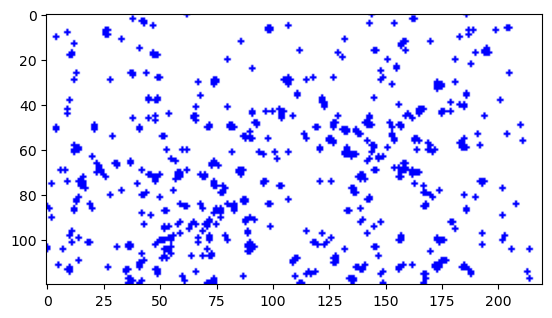

In [6]:
input_folder = "templates"
output_folder = "templates_processed"
min_distance = 3 # Minimum distance between peaks that should be removed
threshold_rel = 0.14 # Relative intensity threshold for peak detection (relative to max peak) [0.1-0.2, depending on the differnce between your peaks]
dilation_iterations = 1 # Number of iterations for dilating the peak mask [max 2, otherwise axons might be affected]

dilated_peak_mask, templates, template_files = calculate_peak_mask(overview_path, input_folder, min_distance=min_distance, threshold_rel=threshold_rel, dilation_iterations=dilation_iterations)

cmap = plt.cm.colors.ListedColormap(['white', 'blue'])
plt.imshow(dilated_peak_mask.T, cmap=cmap, origin='upper')
plt.show()

In [7]:
ais_radius = 10 # Radius around the AIS to protect (in pixels)
processed_templates = peak_mask_processing(overview_path, output_folder, dilated_peak_mask, templates, template_files, ais_rad = ais_radius)

Processed templates saved to: templates_processed


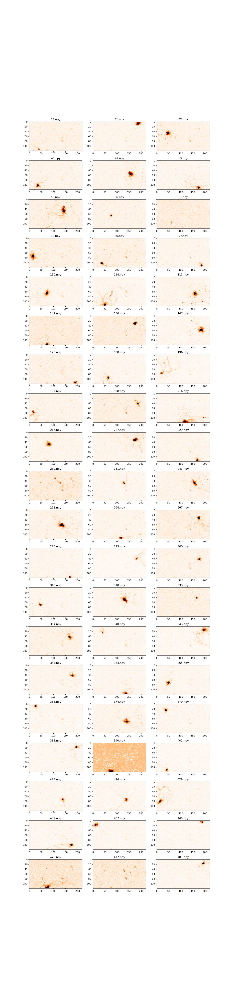

In [8]:
vis.plot_template_overview2(overview_path, n_cols = 3, vmin=-10, vmax=0, foldername='templates_processed', filename='overview_processed', unit_ids= None, overwrite=False)
plt.show()

### Remove templates with low signal to noise ratio

In [9]:
def show_template(template, group, snr, noise):
    temp_diff = np.diff(template)
    tmp_filt = nd.gaussian_filter(temp_diff, sigma=1)
    plt.imshow(np.min(tmp_filt, axis=2).T, vmin=-10, vmax=0, cmap="gist_heat")
    plt.title(f"Shown: {group} - SNR: {snr:.2f} - Noise: {noise:.2f}")
    plt.show()

def remove_noisy_templates(templates, noise_threshold=0.5, snr_threshold=100, show_which="none"):
    """
    Removes templates with a low signal-to-noise ratio (SNR).

    Args:
        templates: List of 3D numpy arrays.
        noise_threshold: Minimum noise level to check a template for SNR.
        snr_threshold: Minimum SNR to keep a template.
        show_which: Which templates to show ("good", "bad", "all", "none").

    Returns:
        List of templates with Noise below threshold or SNR above the threshold.
    """
    good_templates = templates.copy()
    bad_templates = []
    for i, template in enumerate(good_templates):
        noise = np.median(skel.generate_noise_matrix(template, mode="mad"))
        signal = np.abs(np.min(template))
        snr = signal / noise

        # Only for high noise levels, we want to consider removing them
        if noise > noise_threshold:
            
            if snr < snr_threshold:
                bad_templates.append(template)
                good_templates.pop(i)
                
                if show_which == "bad":
                    show_template(template, show_which, snr, noise)
        
        
        # Showing the templates
        if noise < noise_threshold or snr > snr_threshold:
            if show_which == "good":
                show_template(template, show_which, snr, noise)
        
        if show_which == "all": 
            show_template(template, show_which, snr, noise)

    return good_templates

In [10]:
filtered_templates = remove_noisy_templates(processed_templates, noise_threshold=0.5, snr_threshold=200, show_which="none")

### Remove duplicates

In [55]:
# Correlation for all comparisons is the same - there is something wrong with the window that is compared

def show_duplicates(template1, peak1, i, template2, peak2, j):
    """
    Show the duplicates and their corresponding AIS given the templates and their peaks.
    """
    temp_diff = np.diff(template1)
    tmp_filt = nd.gaussian_filter(temp_diff, sigma=1)
    plt.subplot(1, 2, 1)
    plt.imshow(
        np.min(tmp_filt, axis=2).T, vmin=-10, vmax=0, cmap="gist_heat"
    )
    plt.scatter(peak1[0], peak1[1], marker='x', color='blue', s=20)
    plt.title(f"Template {i}")

    temp_diff2 = np.diff(template2)
    tmp_filt2 = nd.gaussian_filter(temp_diff2, sigma=1)
    plt.subplot(1, 2, 2)
    plt.imshow(
        np.min(tmp_filt2, axis=2).T, vmin=-10, vmax=0, cmap="gist_heat"
    )
    plt.scatter(peak2[0], peak2[1], marker='x', color='blue', s=20)
    plt.title(f"Template {j}")
    plt.show()

    print(f"Peak 1: {peak1} and Peak 2: {peak2}")


def remove_duplicate_templates(processed_templates, params, euc_dist=5, threshold=0.9):
    """
    Removes duplicate templates by comparing the templates to each other.

    Args:
        processed_templates: List of 3D numpy arrays.
        params: Dictionary with parameters.
        rad: Radius which is considered as the same AIS
        threshold: Correlation threshold for considering two templates as duplicates.

    Returns:
        List of unique templates.
    """
    unique_templates = []
    for i, template in enumerate(processed_templates):
        is_duplicate = False
        current_capped, current_peak = skel.localize_ais(template, params)
        
        # Compare the current template to all unique templates
        if current_peak.size != 0:            
            for j, unique_template in enumerate(unique_templates):
                # Find the peak in the current template
                unique_capped, unique_peak = skel.localize_ais(unique_template, params)
                if unique_peak.size == 0:
                    print(f"Unique template {j} has no peak")
                    continue

                # Calculate distance of AIS
                # print(current_peak, unique_peak)
                x_dist = abs(current_peak[0] - unique_peak[0])
                y_dist = abs(current_peak[1] - unique_peak[1])
                # print(f"Distance between {i} and {j}: {x_dist}, {y_dist}")
                
                if np.sqrt(x_dist**2 + y_dist**2) < euc_dist:
                    current_noise_level = np.mean(skel.generate_noise_matrix(template, mode="mad"))
                    unique_noise_level = np.mean(skel.generate_noise_matrix(unique_template, mode="mad"))
                    if current_noise_level < unique_noise_level:
                        
                        show_duplicates(template, current_peak, i, unique_template, unique_peak, j)

                        unique_templates.pop(j)
                        print(f"Template {j} was removed")
                        unique_templates.append(template)
                    else:
                        is_duplicate = True
                        show_duplicates(template, current_peak, i, unique_template, unique_peak, j)
                        print(f"Template {i} was removed")
                        # Stop comparing
                        break
                    

            if not is_duplicate:
                unique_templates.append(template)

    return unique_templates






""" 
# Calculate the correlation between the two peaks
x, y = current_peak[:2]
correlation = np.corrcoef(current_capped[x-rad:x+rad, y-rad:y+rad, 0], unique_capped[x-rad:x+rad, y-rad:y+rad, 0])[0, 1]
print(f"Correlation between {i} and {j}: {correlation}")
# Check if the correlation is above the threshold
if correlation > threshold: 
"""


' \n# Calculate the correlation between the two peaks\nx, y = current_peak[:2]\ncorrelation = np.corrcoef(current_capped[x-rad:x+rad, y-rad:y+rad, 0], unique_capped[x-rad:x+rad, y-rad:y+rad, 0])[0, 1]\nprint(f"Correlation between {i} and {j}: {correlation}")\n# Check if the correlation is above the threshold\nif correlation > threshold: \n'

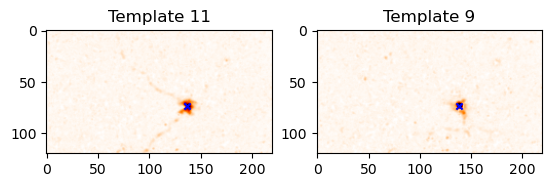

Peak 1: [137  73  10] and Peak 2: [138  73  10]
Template 11 was removed


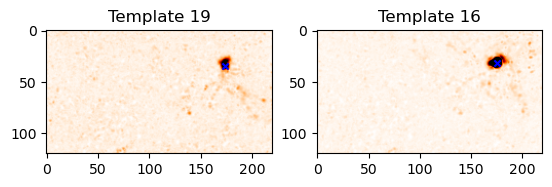

Peak 1: [174  34  10] and Peak 2: [175  31  10]
Template 19 was removed


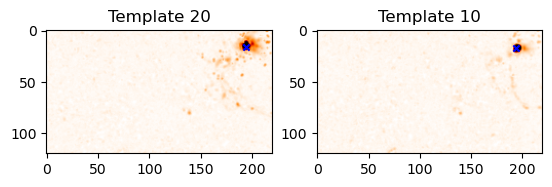

Peak 1: [194  16  10] and Peak 2: [194  17  10]
Template 10 was removed


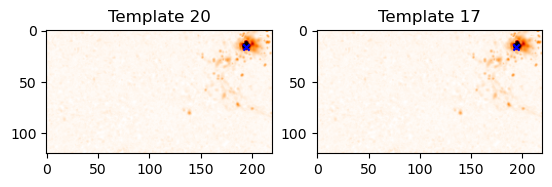

Peak 1: [194  16  10] and Peak 2: [194  16  10]
Template 20 was removed


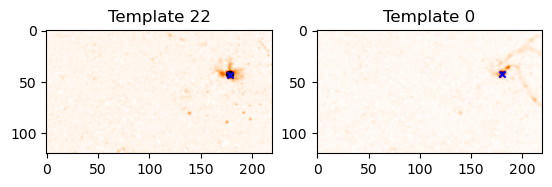

Peak 1: [179  43  10] and Peak 2: [180  42  10]
Template 22 was removed


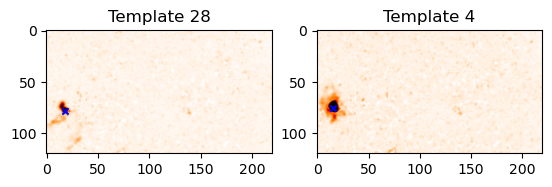

Peak 1: [18 78 10] and Peak 2: [15 75 10]
Template 4 was removed


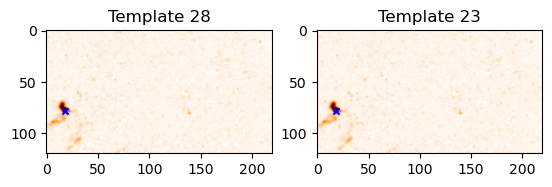

Peak 1: [18 78 10] and Peak 2: [18 78 10]
Template 28 was removed


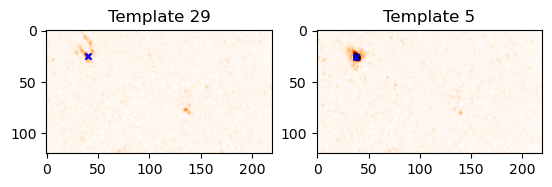

Peak 1: [40 25 10] and Peak 2: [38 26 10]
Template 5 was removed


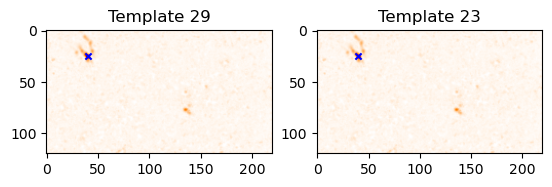

Peak 1: [40 25 10] and Peak 2: [40 25 10]
Template 29 was removed


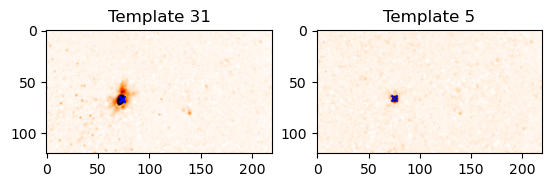

Peak 1: [73 67 10] and Peak 2: [75 66 10]
Template 5 was removed


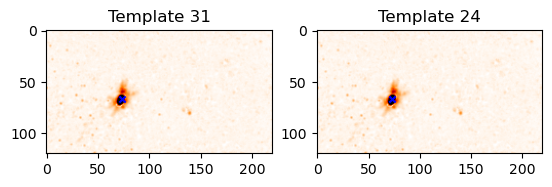

Peak 1: [73 67 10] and Peak 2: [73 67 10]
Template 31 was removed


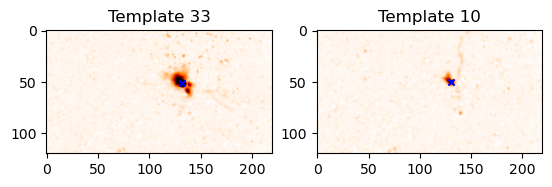

Peak 1: [132  51  10] and Peak 2: [130  50  10]
Template 33 was removed


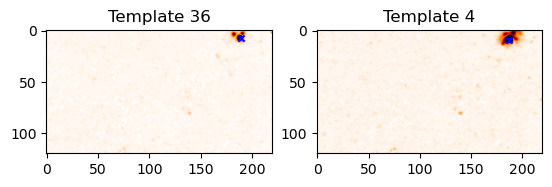

Peak 1: [189   7  10] and Peak 2: [187   9  10]
Template 4 was removed


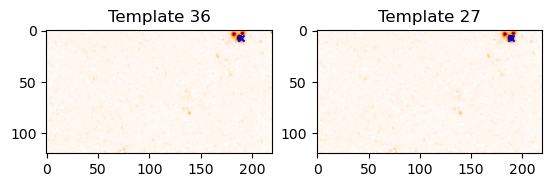

Peak 1: [189   7  10] and Peak 2: [189   7  10]
Template 36 was removed


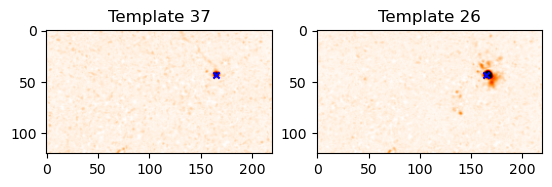

Peak 1: [165  43  10] and Peak 2: [165  43  10]
Template 37 was removed


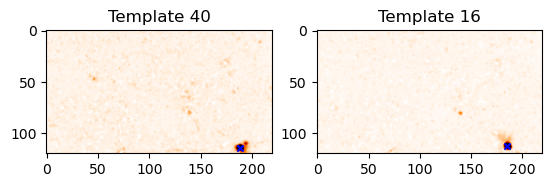

Peak 1: [188 114  10] and Peak 2: [185 112  10]
Template 40 was removed


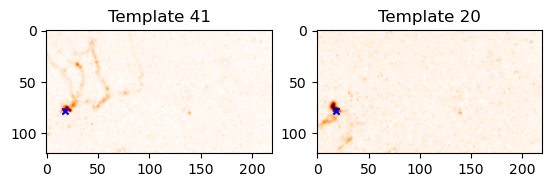

Peak 1: [18 78 10] and Peak 2: [18 78 10]
Template 20 was removed


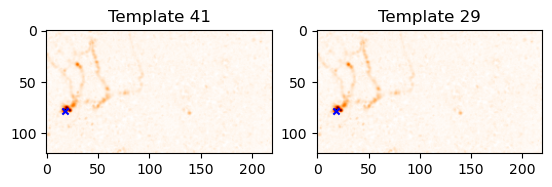

Peak 1: [18 78 10] and Peak 2: [18 78 10]
Template 41 was removed


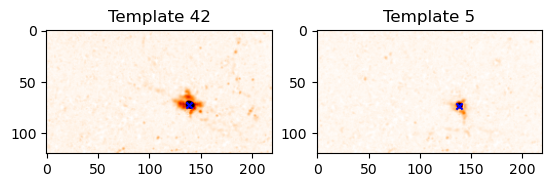

Peak 1: [139  72  10] and Peak 2: [138  73  10]
Template 42 was removed


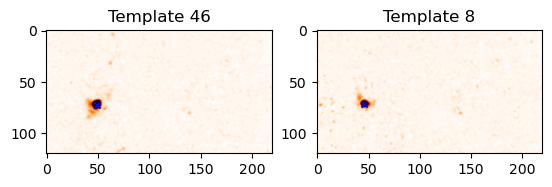

Peak 1: [49 72 10] and Peak 2: [45 71 10]
Template 8 was removed


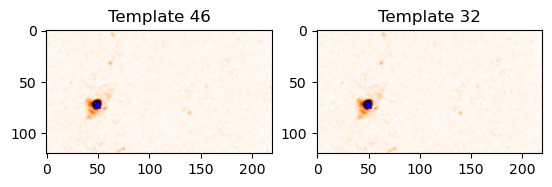

Peak 1: [49 72 10] and Peak 2: [49 72 10]
Template 46 was removed


In [56]:
unique_templates = remove_duplicate_templates(filtered_templates, params, euc_dist=5, threshold=0.9)

In [86]:
from scipy.spatial.distance import pdist

def keep_percentile_2D(template, percentile=10):
    """
    Keeps only the most negative signal values in a template,
    setting all other values to zero.

    Args:
        template: A NumPy array (presumably 3D, but works for any dimension).
        Percentile: How many percent should be kept

    Returns:
        Thresholded NumPy array flattened to 2D.
    """
    if not isinstance(template, np.ndarray):
        raise TypeError("Input must be a NumPy array.")

    template_2D = np.min(template, axis=2)

    # Identify all negative values
    negative_mask = template_2D < 0
    negative_values = template_2D[negative_mask]

    # Determine the threshold at the corresponding percentile
    threshold_value = np.percentile(negative_values, percentile)

    # Create a mask for the values to keep
    keep_mask = (template_2D <= threshold_value) & negative_mask

    # Use the mask on the output template
    output_template = template_2D.copy()
    output_template[~keep_mask] = 0

    return output_template


def show_duplicates(template1, peak1, i, template2, peak2, j):
    """
    Show the duplicates and their corresponding AIS given the templates and their peaks.
    """
    temp_diff = np.diff(template1)
    tmp_filt = nd.gaussian_filter(temp_diff, sigma=1)
    plt.subplot(1, 2, 1)
    plt.imshow(
        np.min(tmp_filt, axis=2).T, vmin=-10, vmax=0, cmap="gist_heat"
    )
    plt.scatter(peak1[0], peak1[1], marker='x', color='blue', s=20)
    plt.title(f"Template {i}")

    temp_diff2 = np.diff(template2)
    tmp_filt2 = nd.gaussian_filter(temp_diff2, sigma=1)
    plt.subplot(1, 2, 2)
    plt.imshow(
        np.min(tmp_filt2, axis=2).T, vmin=-10, vmax=0, cmap="gist_heat"
    )
    plt.scatter(peak2[0], peak2[1], marker='x', color='blue', s=20)
    plt.title(f"Template {j}")
    plt.show()

    print(f"Peak 1: {peak1} and Peak 2: {peak2}")


def remove_duplicate_templates_euc(templates, params, dist_threshold=5, corr_threshold=0.9, percentile=10):
    """
    Removes duplicate templates by comparing the templates to each other.
    Args:
        processed_templates: List of 3D numpy arrays.
        params: Dictionary with parameters.
        rad: Radius which is considered as the same AIS
        threshold: Correlation threshold for considering two templates as duplicates.
    Returns:
        List of unique templates.
    """

    # Find all the AIS on the templates and remove the ones without an AIS
    peaks = []
    for i, template in enumerate(templates):
        matrix_capped, peak = skel.localize_ais(template, params)
        if peak.size != 0:
            peaks.append(peak)
        else:
            templates.pop(i)
    

    to_remove = np.array([False for _ in range(len(templates))])
    m = len(peaks)
    euc_dist = pdist(peaks, 'euclidean')
    # condensed matrix: distance saved at m * i + j - ((i + 2) * (i + 1)) // 2
    print(euc_dist)


    for idx, dist in enumerate(euc_dist):
        
        # Check for elements that are below the distance threshold
        if dist < dist_threshold:
            rows, cols = np.triu_indices(m, k=1)
            i = rows[idx]
            j = cols[idx]

            # Flatten everything except the 10 negative percentile and return 2D array
            percentiled_template1 = keep_percentile_2D(templates[i], percentile)
            percentiled_template2 = keep_percentile_2D(templates[j], percentile)

            flattened_template1 = percentiled_template1.flatten()
            flattened_template2 = percentiled_template2.flatten()

            double_zeros = np.array([False for _ in range(flattened_template1.size)])
            for k, val in enumerate(flattened_template1):
                if flattened_template1[k] == 0 and flattened_template2[k] == 0:
                    double_zeros[k] = True
            
            flattened_template1 = flattened_template1[~double_zeros]
            flattened_template2 = flattened_template2[~double_zeros]

            # Only correlate the non-zero values
            correlation = np.corrcoef(flattened_template1, flattened_template2)[0, 1]
            # print(f"Correlation between {i} and {j}: {correlation: .2f}")
            
            # We classify them as duplicates if the correlation is below the threshold
            if correlation > corr_threshold:
                print(f"Template {i} and {j} are duplicates")
                noise_level1 = np.mean(skel.generate_noise_matrix(templates[i], mode="mad"))
                noise_level2 = np.mean(skel.generate_noise_matrix(templates[j], mode="mad"))
                
                if noise_level1 < noise_level2:
                    show_duplicates(templates[i], peaks[i], i, templates[j], peaks[j], j)
                    to_remove[j] = True
                    print(f"Template {j} was removed")
                else:
                    show_duplicates(templates[i], peaks[i], i, templates[j], peaks[j], j)
                    to_remove[i] = True
                    print(f"Template {i} was removed")

    
    unique_templates = []
    for i, template in enumerate(templates):
        if ~to_remove[i]:
            unique_templates.append(template)

    return unique_templates

[157.70859203  16.76305461  33.42154993 ... 106.53168543 143.75326083
  37.36308338]
Template 4 and 21 are duplicates


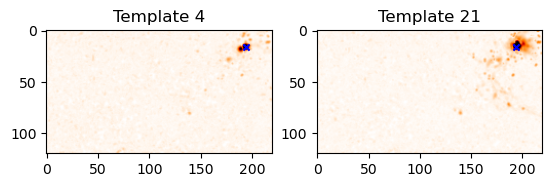

Peak 1: [194  16  10] and Peak 2: [194  16  10]
Template 4 was removed
Template 18 and 35 are duplicates


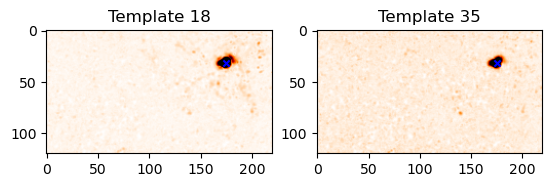

Peak 1: [175  31  10] and Peak 2: [175  31  10]
Template 35 was removed
Template 26 and 38 are duplicates


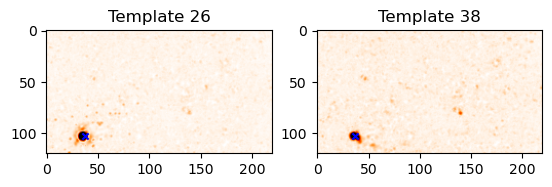

Peak 1: [ 37 103  10] and Peak 2: [ 37 103  10]
Template 38 was removed
Template 30 and 32 are duplicates


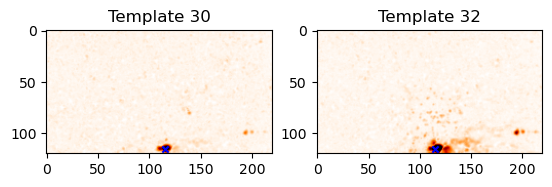

Peak 1: [115 115  10] and Peak 2: [115 115  10]
Template 30 was removed


In [87]:
unique_templates = remove_duplicate_templates_euc(filtered_templates, params, dist_threshold=5, corr_threshold=0.8, percentile=5)

In [54]:
print(f"Total templates: {len(filtered_templates)}")
print(f"Unique templates: {len(unique_templates)}")

Total templates: 52
Unique templates: 48


### Volume Filter

In [40]:
def volume_filter(template, min_volume, max_volume):
    volume = np.sum(np.abs(template))
    print(volume)
    return min_volume <= volume <= max_volume

if not volume_filter(template, min_volume=1000, max_volume=1000000):
    print("Template rejected: volume out of range")

835558.2203201987


In [38]:
max = np.max(template)
print(max)

10.180864334106445


### Solidity Filter

In [39]:
from scipy.spatial import ConvexHull
from skimage.morphology import convex_hull_image

def solidity_filter(template, min_solidity):
    # Use skimage's convex_hull_image for binary data
    convex_hull = convex_hull_image(template)
    template_volume = np.sum(template)
    convex_hull_volume = np.sum(convex_hull)
    print(template_volume, convex_hull_volume)

    # Avoid division by zero
    if convex_hull_volume == 0:
        return False

    solidity = template_volume / convex_hull_volume
    print(solidity)
    return solidity >= min_solidity

# Example usage:
if not solidity_filter(template, min_solidity=0.1): # Adjust min_solidity
    print("Template rejected: low solidity")



# We would have to do that locally around the local maxima<

1021.9701802842319 2111998
0.0004838878541950475
Template rejected: low solidity


## Template Visualisation

### Choose template

In [ ]:
root_path = '/net/bs-filesvr02/export/group/hierlemann/intermediate_data/Maxtwo/phornauer/Torsten_2/241021/T002523/AxonTracking'
stream_id = 'well003'
suffix = "sorter_output" # Typically the sorter_output folder
template_folder = "templates_processed" # Subfolder containing the templates
template_id = 476
full_path = os.path.join(root_path, stream_id, suffix, template_folder) 
template, template_save_file = skel.load_template_file(full_path, template_id)

-407.1895751953125


In [17]:
interp_temp, interp_noise, ais = skel.preprocess_template(template, params)

### Visualize

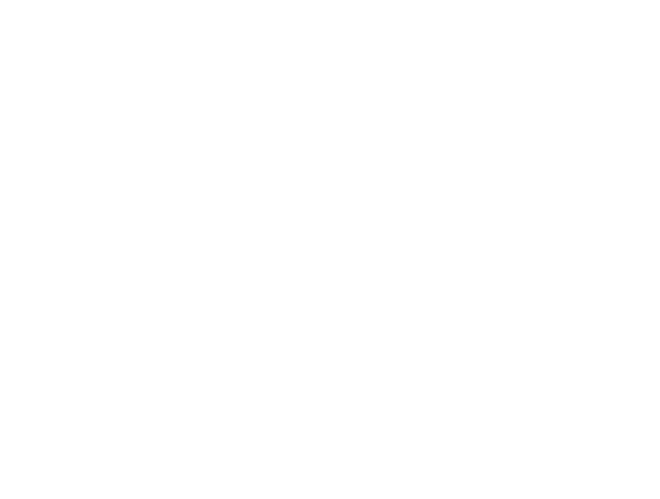

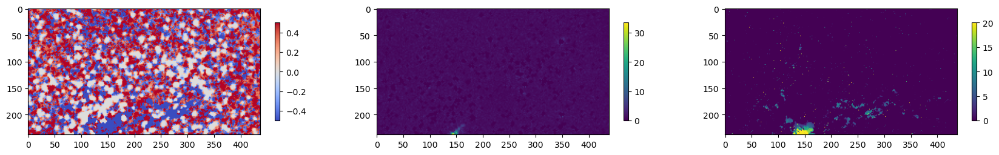

In [53]:
params['max_velocity'] = 0.8 # [m/s]
params['abs_threshold'] = -0.1
params['noise_threshold'] = -0.75
th_template = skel.threshold_template(interp_temp, interp_noise, ais, params) #boolean matrix
vis.plot_template_and_noise(interp_temp, interp_noise, th_template, vrange=[-0.5, 0.5])

In [54]:
ani = vis.generate_propagation_gif(interp_temp, params = params, cumulative=False, downsample=4, clim=[-1,-0.01], cmap="Greys", marker_size=0.1,spacing=1)
HTML(ani.to_jshtml())

In [56]:
ani.save("propagation.gif", writer="imagemagick", fps=10)

## Skeletonization

In [57]:
skel_params = dict()
skel_params['scale'] = 2                       #1
skel_params['const'] = 10                      #3
skel_params['dust_threshold'] = 10
skel_params['anisotropy'] = (10,10,10)
skel_params['tick_threshold'] = 10
skel_params['n_jobs'] = 16

In [58]:
t_cap = [0, th_template.shape[2]] #in samples
skels = skel.skeletonize(th_template[:,:,t_cap[0]:t_cap[1]].astype('bool'), **skel_params)

skeleton = kimimaro.join_close_components(skels[1], radius=50)
skeleton = kimimaro.postprocess(skeleton, tick_threshold=5, dust_threshold=10)
skeleton = skeleton.consolidate()

Skeletonizing Labels:  11%|█         | 16/149 [00:00<00:07, 18.86it/s]


In [38]:
skeleton = skeleton.average_smoothing(n=4,check_boundary=False) #Interferes with scaling
skel_paths = cv.Skeleton.paths(skeleton)
skel_paths_scaled = ut.convert_coor_scale(skel_paths, params)

In [39]:
vis.plot_delay_skeleton(skel_paths_scaled, params, skel_params, figsize=0.5, ais=None, plot_ais_connection=False)

(<Figure size 640x480 with 2 Axes>, <Axes: >)

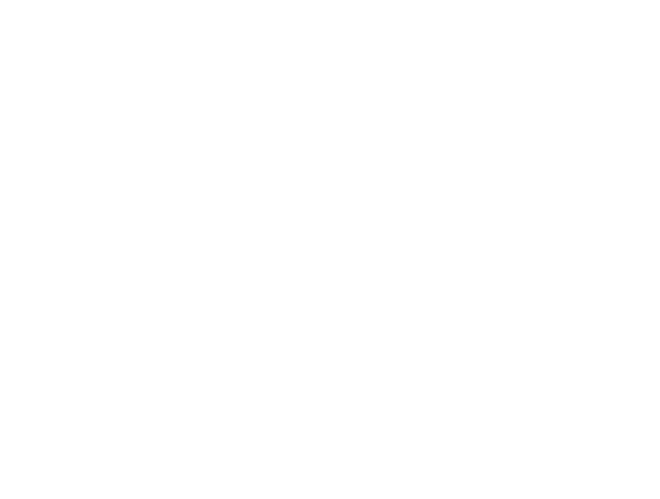

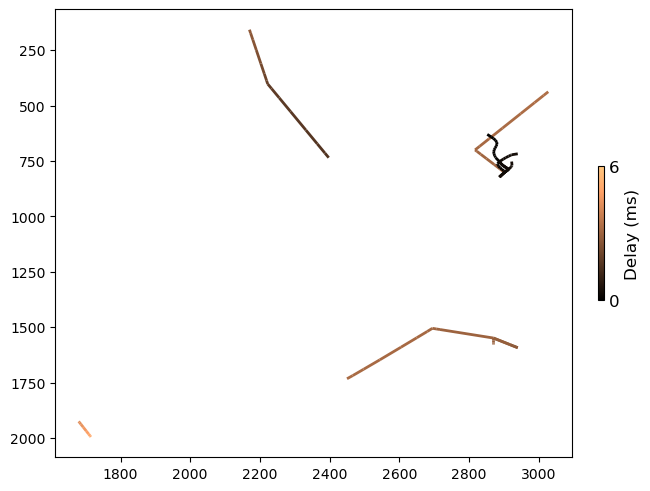

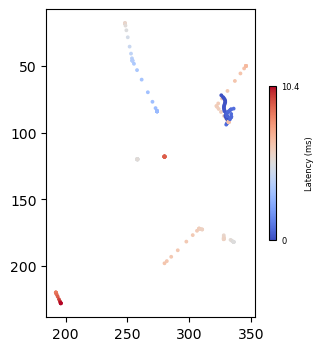

In [40]:
x,y,z = vis.plot_skeleton(skeleton, marker_size=3,fig_size=4,ais=[])

## Quality Control

In [27]:
qc_params = dict()
qc_params['window_size'] = 5
qc_params['max_duplicate_ratio'] = 0.3
qc_params['min_r2'] = 0.9
qc_params['vel_range'] = [0.3, 0.8]
qc_params['min_length'] = 1

In [28]:
all_branches = skel.branches_from_paths(skeleton)
scaled_qc_list, r2s, vels, lengths = skel.perform_path_qc(all_branches, params,**qc_params)

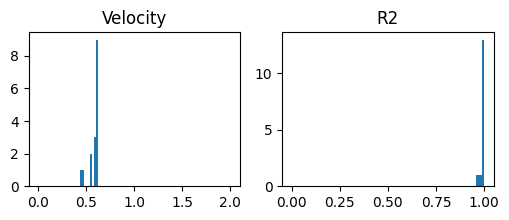

In [29]:
vis.plot_velocity_qc(vels,r2s,fig_size=(6,2))

(<Figure size 640x480 with 2 Axes>, <Axes: >)

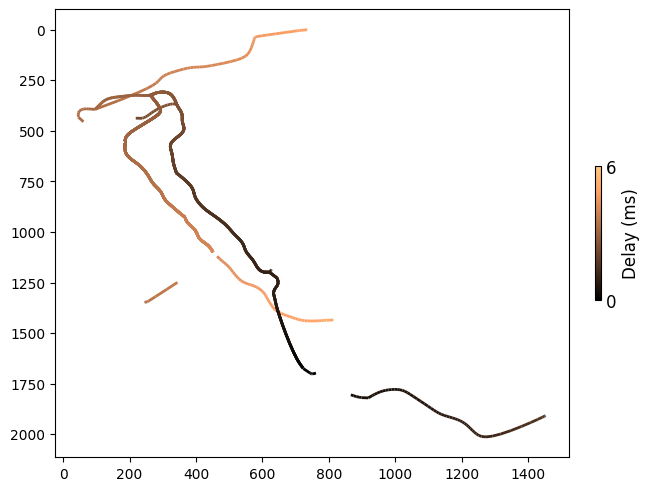

In [30]:
vis.plot_delay_skeleton(scaled_qc_list, params, skel_params, figsize=0.5, ais=None, plot_ais_connection=False)

## Fixing Skeleton

In [32]:
qc_skel = [skeleton.from_path(x) for x in scaled_qc_list]

In [45]:
qc_skeleton = skeleton.simple_merge(qc_skel)
qc_skeleton = kimimaro.join_close_components(qc_skeleton,radius=100)
qc_skeleton = kimimaro.postprocess(qc_skeleton, dust_threshold=500, tick_threshold=10)
qc_skeleton = qc_skeleton.consolidate()

761.25


(<Figure size 640x480 with 2 Axes>, <Axes: >)

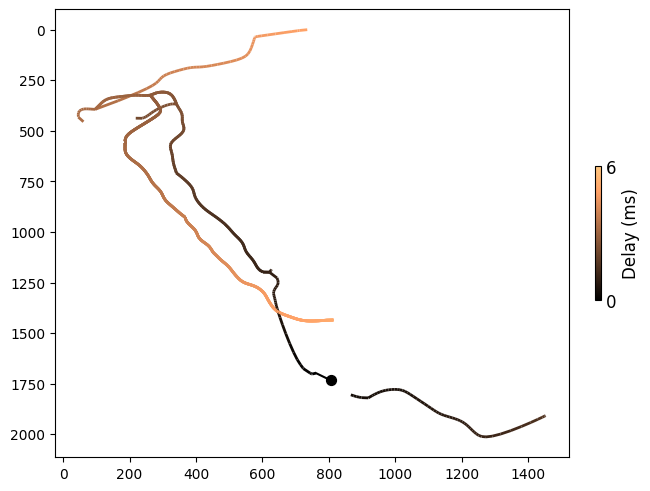

In [54]:
ais_um = np.array(ais) * (params["el_spacing"],params["el_spacing"],1)
vis.plot_delay_skeleton(qc_skeleton.paths(), params, skel_params,figsize=0.5, ais=ais_um, plot_ais_connection=True)

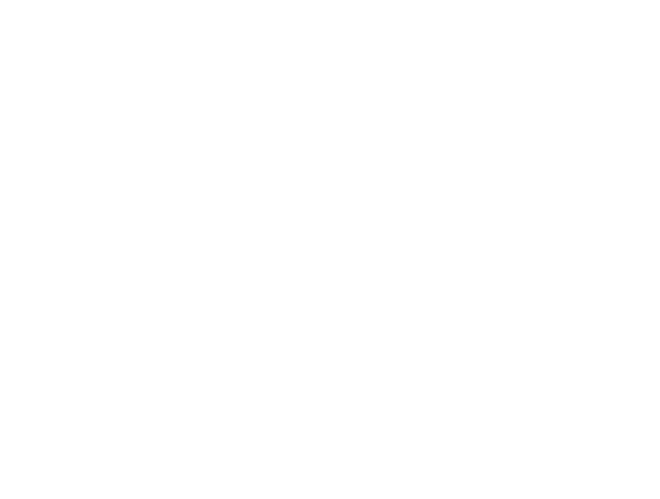

In [ ]:
plot_vertices = qc_skeleton.vertices / (params["el_spacing"],params["el_spacing"],1) # convert x and y to um, keep z in samples
ani = vis.generate_propagation_gif(interp_temp, params = params, cumulative=False, vertices=plot_vertices, downsample=4, clim=[-2, -0.1], cmap="Greys", marker_size=0.1)
HTML(ani.to_jshtml())

In [76]:
np.min(interp_temp)

-2.816161632537842

## Save Images

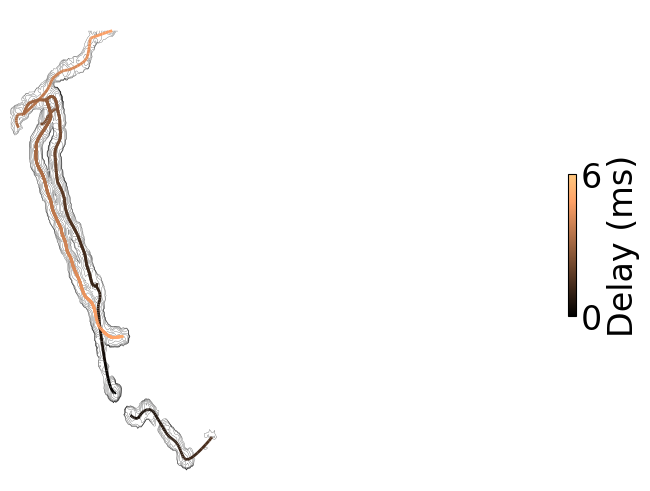

In [79]:
save_path = os.path.join(root_path,stream_id,str(template_id)+'_delay.png')
vis.plot_delay_contour(interp_temp,qc_skeleton,params,skel_params, radius=5, save_path=[], linewidth=2, n_contours = 10)

In [71]:
save_path = os.path.join(root_path,stream_id,str(template_id)+'.png')
save_path

'/net/bs-filesvr02/export/group/hierlemann/intermediate_data/Maxtwo/phornauer/EI_iNeurons/241218/T002523/AxonTracking/well003/137.png'

In [86]:
np.min(interp_temp)

-2.816161632537842

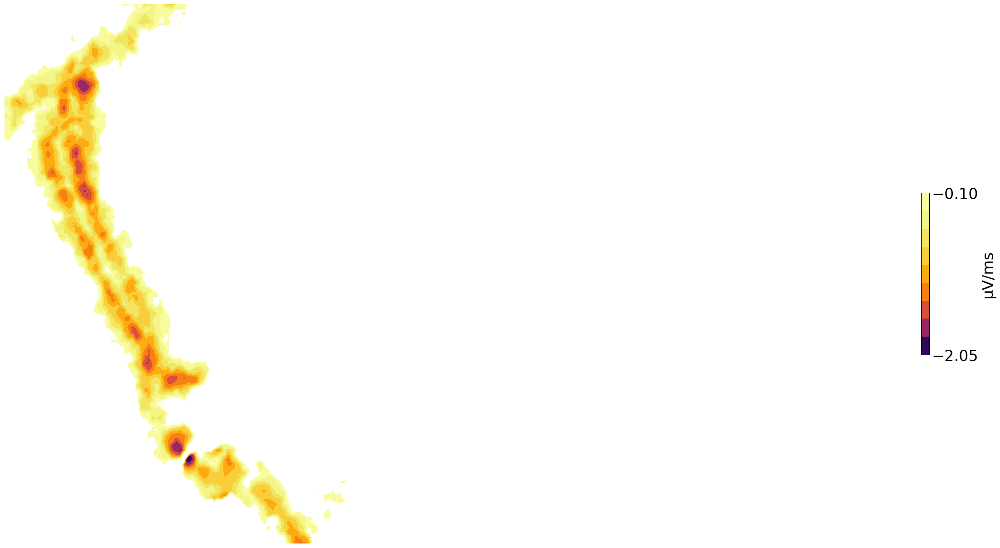

In [91]:
vis.plot_filled_contour(interp_temp,qc_skeleton,params,radius=10,save_path=[])

In [ ]:
import pickle
# Save the skeleton 
# Ideally, the skeleton should be saved in the same folder as the templates
with open('skel.pkl', 'wb') as file: 
    # A new file will be created 
    pickle.dump(qc_skeleton, file) 

In [ ]:
# Load the skeleton
with open('skel.pkl', 'rb') as file: 
    # Call load method to deserialze 
    myvar = pickle.load(file) 